# MATPLOTLIB Plots
* use DPI of 300
* fontsize of 18-20

Mission Objectives:
* Focus on iVar functionality (Flowchart)
    * Trimming: Primers and Quality
    * Consensus generation
    * Variants calling, variant filtering
* It is better to look at iSNVs across all the samples without necessarily answering specific questions
* Treat as a cataloguing exercise that showcase iVar functionality and the type of information a user can gather from iVar’s output
* Identify major iSNVs across samples, categorize into synonymous and non-synonymous
* Plot ALT_FREQ for each gene. Gene can be identified from GFF_FEATURE. (Figure)
* Identify indel iSNVs and their prevalence(Figure)
* Analyze changes in iSNVs across time  to see how they evolve (?)
* Present as a set of analysis methods that complement the iVar tool
* Maybe we can show that we have a conda environment for running the pipeline and we can create a github repo for it. (Figure?)
* PrimalSeq protocol schematic
* Entropy of each position on the genome -> Maybe faceted by location? 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import entropy
import plotly.express as px
import plotly.graph_objects as go
import gffutils

In [3]:
all_variants = pd.read_csv("/Users/al/Documents/scripps/data/all_variants.csv")

/Users/al/anaconda3/envs/scripps/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
all_variants.columns

Index(['REGION', 'POS', 'REF', 'ALT', 'REF_DP', 'REF_RV', 'REF_QUAL', 'ALT_DP',
       'ALT_RV', 'ALT_QUAL', 'ALT_FREQ', 'TOTAL_DP', 'PVAL', 'PASS',
       'GFF_FEATURE', 'REF_CODON', 'REF_AA', 'ALT_CODON', 'ALT_AA', 'path'],
      dtype='object')

In [5]:
# variant_paths = !find /home/gk/analysis/ -type f -path '*variants*' -name '*.tsv'

In [14]:
released_seqs = !find /Users/al/Documents/scripps/code/HCoV-19-Genomics -type f -path '*consensus*' -name '*.fa'

In [15]:
# len(variant_paths)

In [16]:
len(released_seqs)

1075

In [17]:
released_seqs = [f.split('/')[-1].split('.')[0] for f in released_seqs]
# released_seqs

In [26]:
released_seqs[:5]

['SEARCH-0833-SAN',
 'SEARCH-0933-SAN',
 'SEARCH-0177-SAN',
 'SEARCH-1311-SAN',
 'SEARCH-0491-SAN']

In [18]:
# variant_paths

In [19]:
# variant_paths = [p for p in variant_paths if not ('49idSEARCH0508SAN' in p or '54idSEARCH0513SAN' in p)]

In [20]:
# len(variant_paths)

In [21]:
# all_variants = pd.concat((pd.read_csv(path, sep='\t').assign(path=path) for path in variant_paths))

In [22]:
column_filter = [col for col in all_variants.columns if ('49idSEARCH0508SAN' in col or '54idSEARCH0513SAN' in col or 'Unnamed' in col)]
all_variants.drop(columns=column_filter, inplace=True)

In [23]:
print(all_variants.shape)

(95781, 20)


In [24]:
# all_variants.to_csv("all_variants.csv", index=False)

In [25]:
print(all_variants.shape)

(95781, 20)


In [17]:
all_variants.dropna(subset=['POS', 'ALT_FREQ'], inplace=True)

In [18]:
all_variants['date'] = all_variants['path'].apply(lambda x: '-'.join(x.split('/')[4].split('.')[:3]))

In [19]:
all_variants['date'] = pd.to_datetime(all_variants['date'])

In [20]:
all_variants['date'].max(), all_variants['date'].min()

(Timestamp('2020-09-15 00:00:00'), Timestamp('2020-04-06 00:00:00'))

In [21]:
all_variants['sample_id'] = all_variants['path'].apply(lambda x: x.split('/')[-1].split('_')[0])
print(all_variants['sample_id'].unique().shape)

(2916,)


In [22]:
std_variants = all_variants.loc[(all_variants['sample_id'].str.contains('-')) & (~all_variants['sample_id'].str.contains('id'))]
std_variants['sample_id'] = std_variants['sample_id'].apply(lambda x: ''.join(x.split('-')))
print(std_variants['sample_id'].unique().shape)

(2255,)


<ipython-input-22-75422188254e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  std_variants['sample_id'] = std_variants['sample_id'].apply(lambda x: ''.join(x.split('-')))


In [23]:
nonstd_variants = all_variants.loc[(all_variants['sample_id'].str.contains('id')) & (~all_variants['sample_id'].str.contains('-'))]
nonstd_variants['sample_id'] = nonstd_variants['sample_id'].apply(lambda x: x[4:])
print(nonstd_variants['sample_id'].unique().shape)

(642,)


<ipython-input-23-a29a340e480b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonstd_variants['sample_id'] = nonstd_variants['sample_id'].apply(lambda x: x[4:])


In [24]:
all_variants.shape

(95773, 22)

In [25]:
variants = pd.concat([std_variants, nonstd_variants], axis=0)

In [26]:
variants['sample_id']

1509     SEARCH0855SAN
1510     SEARCH0855SAN
1511     SEARCH0855SAN
1512     SEARCH0855SAN
1513     SEARCH0855SAN
             ...      
95776    SEARCH0155NBG
95777    SEARCH0155NBG
95778    SEARCH0155NBG
95779    SEARCH0155NBG
95780    SEARCH0155NBG
Name: sample_id, Length: 94927, dtype: object

In [27]:
released_seqs = [''.join(s.split('-')) for s in released_seqs]
len(released_seqs)

1075

In [28]:
variants = variants.loc[variants['sample_id'].isin(released_seqs)]
print(variants['sample_id'].unique().shape)

(772,)


In [29]:
print(variants.shape)
print(variants.dropna(subset=['POS', 'ALT_FREQ']).shape)

(23890, 22)
(23890, 22)


In [30]:
major_vars = variants.loc[variants['ALT_FREQ']>0.5] 
major_vars['ALT_FREQ'] = 1 - major_vars['ALT_FREQ']
major_vars = major_vars.loc[major_vars['ALT_FREQ'] >= 0.03]
major_vars['ALT'] = major_vars['REF']
major_vars['ALT_AA'] = major_vars['REF_AA']

<ipython-input-30-60c2458443aa>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  major_vars['ALT_FREQ'] = 1 - major_vars['ALT_FREQ']


In [31]:
freq_filter = ((variants['ALT_FREQ'] <= 0.5) & (variants['ALT_FREQ'] >= 0.03))
variants = variants.loc[freq_filter]
print(variants.shape)
print(variants['sample_id'].unique().shape)

(15352, 22)
(723,)


In [32]:
# variants = pd.concat([variants, major_vars])

In [33]:
variants = variants.sort_values('date')

In [34]:
variants.drop_duplicates(subset=['sample_id', 'POS', 'ALT'], keep='last', inplace=True)
print(variants.shape)
print(variants['sample_id'].unique().shape)

(11945, 22)
(723,)


In [35]:
variants['VAR'] = variants['POS'].astype(str) + '-' + variants['ALT']

In [36]:
variants.loc[variants['ALT_AA']==variants['REF_AA']].shape[0]

2238

In [37]:
variants.loc[variants['ALT_AA'].isna()]

,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,PASS,GFF_FEATURE,REF_CODON,REF_AA,ALT_CODON,ALT_AA,path,date,sample_id,VAR
930,NC_045512.2,22583,G,-TT,1533.0,873.0,42.0,63.0,0.0,20.0,...,True,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,22583--TT
931,NC_045512.2,23393,C,-T,139247.0,67660.0,51.0,6943.0,0.0,20.0,...,True,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,23393--T
938,NC_045512.2,26573,T,-GAACAATGGAACCTAGTAATAGGTTTCCTA,4066.0,455.0,41.0,161.0,0.0,20.0,...,True,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,26573--GAACAATGGAACCTAGTAATAGGTTTCCTA
928,NC_045512.2,21885,C,-TACTT,1999.0,803.0,50.0,115.0,0.0,20.0,...,True,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,21885--TACTT
942,NC_045512.2,29568,T,-A,28.0,11.0,55.0,2.0,0.0,20.0,...,False,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,29568--A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83853,NC_045512.2,31,A,G,17.0,9.0,31.0,1.0,0.0,36.0,...,False,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1668SAN,31-G
83856,NC_045512.2,6696,C,+T,3719.0,1435.0,50.0,209.0,0.0,20.0,...,True,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1668SAN,6696-+T
83859,NC_045512.2,21979,A,-TTTTTGGGTG,455.0,351.0,39.0,28.0,0.0,20.0,...,True,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1668SAN,21979--TTTTTGGGTG
36148,NC_045512.2,24451,T,-A,14.0,2.0,38.0,1.0,0.0,20.0,...,False,NaN,NaN,NaN,NaN,NaN,/home/gk/analysis/2020.08.10.hCoV19/variants/i...,2020-08-10,SEARCH1679SAN,24451--A


In [38]:
variants['iSNV Type'] = 'unknown'
variants.loc[(variants['REF_AA']!=variants['ALT_AA']) & (~variants['ALT_AA'].isna()), 'iSNV Type'] = 'non-synonymous'
variants.loc[(variants['REF_AA']==variants['ALT_AA']) & (~variants['ALT_AA'].isna()), 'iSNV Type'] = 'synonymous'
variants.loc[(variants['ALT'].str.contains('-')), 'iSNV Type'] = 'deletion'
variants.loc[(variants['ALT'].str.contains('\+')), 'iSNV Type'] = 'insertion'
variants.loc[variants['iSNV Type']=='unknown'].shape

(357, 24)

In [39]:
variants.loc[(~variants['iSNV Type'].isin(['insertion', 'deletion'])) & (variants['ALT_AA'].isna()), 'iSNV Type'].value_counts()

unknown    357
Name: iSNV Type, dtype: int64

In [40]:
variants['REGION'].value_counts()

NC_045512.2    11945
Name: REGION, dtype: int64

In [41]:
variants['GFF_FEATURE'].value_counts()

cds-YP_009724389.1    3731
cds-YP_009725295.1    1518
cds-YP_009724390.1    1002
cds-YP_009724397.2     359
cds-YP_009724391.1     298
cds-YP_009724395.1     290
cds-YP_009724396.1     187
cds-YP_009724393.1     160
cds-YP_009725318.1     128
cds-YP_009724392.1      95
cds-YP_009725255.1      55
cds-YP_009724394.1      32
Name: GFF_FEATURE, dtype: int64

In [42]:
fn = gffutils.example_filename('/Users/alaa/Documents/scripps/data/NC_045512.2.gff3')
# print(open(fn).read()) 

In [43]:
db = gffutils.create_db(fn, dbfn='test.db', merge_strategy='merge', force=True)

In [44]:
all_gffs = variants['GFF_FEATURE'].dropna().unique()
gff2gene = {}
for gff in all_gffs:
    if gff:
        gff2gene[gff] = db[gff]['gene'][0]
gff2gene

{'cds-YP_009724390.1': 'S',
 'cds-YP_009724391.1': 'ORF3a',
 'cds-YP_009724392.1': 'E',
 'cds-YP_009724393.1': 'M',
 'cds-YP_009724397.2': 'N',
 'cds-YP_009725255.1': 'ORF10',
 'cds-YP_009725295.1': 'ORF1ab',
 'cds-YP_009724389.1': 'ORF1ab',
 'cds-YP_009724395.1': 'ORF7a',
 'cds-YP_009724396.1': 'ORF8',
 'cds-YP_009725318.1': 'ORF7b',
 'cds-YP_009724394.1': 'ORF6'}

In [45]:
variants['gene'] = variants['GFF_FEATURE'].apply(lambda x: gff2gene.get(x, 'nan'))

In [46]:
variants = variants.loc[~((variants['iSNV Type'].isin(['insertion', 'deletion'])) & (variants['ALT'].str.len() <= 3))]

# VALIDATION

# Nucleotide-to-Nucleotide Distributions

In [47]:
variants['iSNV Type'].unique()

array(['non-synonymous', 'synonymous', 'deletion', 'unknown', 'insertion'],
      dtype=object)

In [48]:
# ignore indel iSNVs
n2n_dists = (variants.loc[~variants['iSNV Type'].isin(['insertion', 'deletion'])]
                     .groupby(['REF', 'ALT'])
                     .size()
                     .reset_index()
                     .rename(columns={0: 'frequency'}))
data = n2n_dists.pivot(index='REF', columns='ALT', values='frequency').fillna(0)

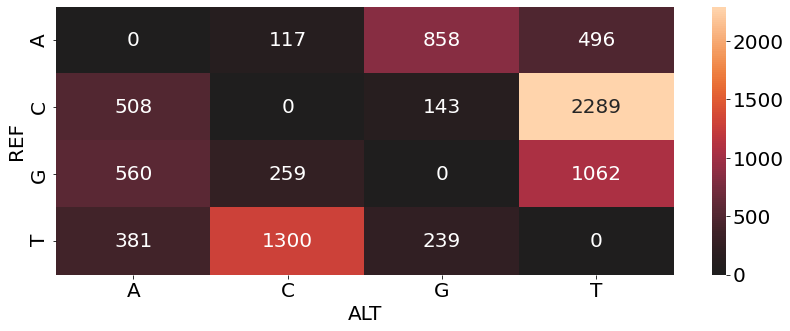

In [49]:

plt.rcParams["figure.figsize"] = (12,5)

plt.rcParams['font.size'] = 20
fig, ax = plt.subplots(1)

p = sns.heatmap(data, center=0.7, annot=True, fmt='g')
plt.tight_layout()

plt.savefig('/Users/alaa/Documents/scripps/figs/n2n_dists.png', dpi=300)

plt.show()

In [50]:
# transitions
816+540

1356

In [51]:
# transversions
2220+1271

3491

In [52]:
# ORF6 iSNVs
(variants.loc[variants['gene'].isin(['ORF6'])]
 .groupby(['POS', 'REF'])
 .agg(alts=('ALT', 'unique'), num_alts=('ALT', 'nunique'), avg_freq=('ALT_FREQ', 'mean'))
 .sort_values('num_alts', ascending=False))

,,alts,num_alts,avg_freq
POS,REF,,,
27203,T,[G],1,0.044056
27213,C,[T],1,0.118123
27371,C,[A],1,0.126289
27366,G,[C],1,0.053333
27362,A,[G],1,0.035129
27359,A,[G],1,0.030064
27346,T,[C],1,0.065603
27343,A,[T],1,0.030793
27342,T,[A],1,0.032558


In [53]:
# ORF7a iSNVs
(variants.loc[variants['gene'].isin(['ORF7a'])]
 .groupby(['POS', 'REF'])
 .agg(alts=('ALT', 'unique'), num_alts=('ALT', 'nunique'), alt_cnts=('ALT', pd.Series.value_counts), 
     freqs=('ALT_FREQ', 'unique'))
 .sort_values('num_alts', ascending=False))

,,alts,num_alts,alt_cnts,freqs
POS,REF,,,,
27633,A,"[C, G, T]",3,"[1, 1, 1]","[0.04, 0.037037, 0.0425532]"
27657,C,"[T, A, G]",3,"[2, 1, 1]","[0.0625, 0.07142860000000001, 0.03571430000000..."
27619,C,"[G, T, A]",3,"[1, 1, 1]","[0.05, 0.0338983, 0.08333330000000001]"
27536,C,"[T, A, G]",3,"[1, 1, 1]","[0.04, 0.030303, 0.0384615]"
27563,C,"[T, G]",2,"[1, 1]","[0.0666667, 0.05]"
...,...,...,...,...,...
27595,C,[A],1,1,[0.2]
27597,T,[A],1,1,[0.07692310000000001]
27598,G,[T],1,1,[0.0344828]


# NON-SYN vs SYN iSNVs

In [54]:
syn_filter = (variants['ALT_AA']==variants['REF_AA']) & (~variants['ALT_AA'].isna())
print(variants.loc[syn_filter, 'VAR'].unique().shape)
syns = variants.loc[syn_filter]
syns.groupby(['POS', 'REF', 'REF_CODON', 'ALT', 'ALT_CODON', 'REF_AA', 'ALT_AA']).size().sum()

(1763,)


2238

In [55]:
nonsyn_filter = (variants['ALT_AA']!=variants['REF_AA']) & (~variants['ALT_AA'].isna())
print(variants.loc[nonsyn_filter, 'VAR'].unique().shape)
nonsyns = variants.loc[nonsyn_filter]
nonsyns.groupby(['POS', 'REF', 'REF_CODON', 'ALT', 'ALT_CODON', 'ALT_AA']).size().sum()

(4624,)


5617

In [56]:
variants.loc[(variants['ALT_AA']==variants['REF_AA'])]

,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,REF_CODON,REF_AA,ALT_CODON,ALT_AA,path,date,sample_id,VAR,iSNV Type,gene
934,NC_045512.2,24766,C,T,68979.0,2923.0,42.0,2270.0,90.0,41.0,...,GTC,V,GTT,V,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,24766-T,synonymous,S
944,NC_045512.2,29605,A,T,30.0,9.0,55.0,1.0,0.0,48.0,...,CTA,L,CTT,L,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,29605-T,synonymous,ORF10
945,NC_045512.2,29641,A,G,29.0,6.0,58.0,1.0,0.0,32.0,...,GCA,A,GCG,A,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,29641-G,synonymous,ORF10
925,NC_045512.2,16554,T,C,4097.0,168.0,45.0,129.0,3.0,45.0,...,TTT,F,TTC,F,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,16554-C,synonymous,ORF1ab
908,NC_045512.2,8099,C,T,355.0,18.0,49.0,17.0,0.0,47.0,...,CTA,L,TTA,L,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,8099-T,synonymous,ORF1ab
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36136,NC_045512.2,20079,A,C,9.0,3.0,41.0,1.0,1.0,32.0,...,CCA,P,CCC,P,/home/gk/analysis/2020.08.10.hCoV19/variants/i...,2020-08-10,SEARCH1679SAN,20079-C,synonymous,ORF1ab
36129,NC_045512.2,12541,A,G,31.0,4.0,43.0,1.0,0.0,36.0,...,GCA,A,GCG,A,/home/gk/analysis/2020.08.10.hCoV19/variants/i...,2020-08-10,SEARCH1679SAN,12541-G,synonymous,ORF1ab
36121,NC_045512.2,9502,C,T,482.0,297.0,47.0,55.0,24.0,52.0,...,GCC,A,GCT,A,/home/gk/analysis/2020.08.10.hCoV19/variants/i...,2020-08-10,SEARCH1679SAN,9502-T,synonymous,ORF1ab
36101,NC_045512.2,6664,C,A,21.0,2.0,63.0,1.0,1.0,36.0,...,GTC,V,GTA,V,/home/gk/analysis/2020.08.10.hCoV19/variants/i...,2020-08-10,SEARCH1679SAN,6664-A,synonymous,ORF1ab


# ORF changing Deletions

In [57]:
del_vars = variants.loc[variants['iSNV Type']=='deletion']
del_vars['indel_len'] = del_vars['ALT'].str.len() - 1
del_vars.indel_len.min(), del_vars.indel_len.max()

<ipython-input-57-096d17f9bea3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del_vars['indel_len'] = del_vars['ALT'].str.len() - 1


(3, 62)

In [58]:
del_vars.columns

Index(['REGION', 'POS', 'REF', 'ALT', 'REF_DP', 'REF_RV', 'REF_QUAL', 'ALT_DP',
       'ALT_RV', 'ALT_QUAL', 'ALT_FREQ', 'TOTAL_DP', 'PVAL', 'PASS',
       'GFF_FEATURE', 'REF_CODON', 'REF_AA', 'ALT_CODON', 'ALT_AA', 'path',
       'date', 'sample_id', 'VAR', 'iSNV Type', 'gene', 'indel_len'],
      dtype='object')

In [59]:
del_vars['ORF Changing Deletion'] = False
del_vars.loc[(del_vars['indel_len']%3)!=0, 'ORF Changing Deletion'] = True

<ipython-input-59-a24770c8392e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del_vars['ORF Changing Deletion'] = False
/Users/alaa/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [60]:
orf_data = del_vars.groupby(['ORF Changing Deletion', 'gene', 'start_pos']).agg(isnv_count=('VAR', 'count')).reset_index()
orf_data.sort_values('start_pos', ascending=True, inplace=True)

KeyError: 'start_pos'

In [ ]:
fig = px.bar(orf_data, y="ORF Changing Deletion", x="isnv_count", 
             color="gene", title="Deletion iSNVs", template='plotly_white')
fig.write_image('/Users/alaa/Documents/scripps/figs/orf_changing_dels.svg')
fig.show()

In [61]:
orf_changing_dels = del_vars.loc[(del_vars['indel_len']%3)!=0]
orf_changing_dels

,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,ALT_CODON,ALT_AA,path,date,sample_id,VAR,iSNV Type,gene,indel_len,ORF Changing Deletion
928,NC_045512.2,21885,C,-TACTT,1999.0,803.0,50.0,115.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,21885--TACTT,deletion,nan,5,True
923,NC_045512.2,14850,A,-TTTG,1131.0,846.0,42.0,45.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,14850--TTTG,deletion,nan,4,True
561,NC_045512.2,6044,A,-ATTTT,5005.0,2167.0,39.0,228.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0098SAN,6044--ATTTT,deletion,nan,5,True
678,NC_045512.2,29790,A,-TATG,27.0,18.0,41.0,2.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0111SAN,29790--TATG,deletion,nan,4,True
892,NC_045512.2,3666,C,-TTATGAAAATT,277.0,113.0,48.0,119.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,3666--TTATGAAAATT,deletion,nan,11,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83533,NC_045512.2,14599,C,-TATTACTAGA,266.0,25.0,36.0,10.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1679SAN,14599--TATTACTAGA,deletion,nan,10,True
83447,NC_045512.2,23554,A,-CCCATTGGTGCAGGTATATGCGCTAGTT,25269.0,4071.0,42.0,1764.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1665SAN,23554--CCCATTGGTGCAGGTATATGCGCTAGTT,deletion,nan,28,True
84890,NC_045512.2,1855,G,-AGTCCTCTTTATGCATTTGCATCAGAGGCTGCTC,2020.0,1428.0,38.0,149.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1672SAN,1855--AGTCCTCTTTATGCATTTGCATCAGAGGCTGCTC,deletion,nan,34,True
83957,NC_045512.2,11078,T,-TTTTG,1446.0,64.0,38.0,324.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1556SAN,11078--TTTTG,deletion,nan,5,True


In [62]:
nonorf_changing_dels = del_vars.loc[(del_vars['indel_len']%3)==0]
nonorf_changing_dels

,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,ALT_CODON,ALT_AA,path,date,sample_id,VAR,iSNV Type,gene,indel_len,ORF Changing Deletion
938,NC_045512.2,26573,T,-GAACAATGGAACCTAGTAATAGGTTTCCTA,4066.0,455.0,41.0,161.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,26573--GAACAATGGAACCTAGTAATAGGTTTCCTA,deletion,nan,30,False
911,NC_045512.2,9060,A,-TTG,6404.0,1032.0,52.0,341.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,9060--TTG,deletion,nan,3,False
588,NC_045512.2,2544,C,-TGG,101.0,59.0,47.0,6.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0117SAN,2544--TGG,deletion,nan,3,False
880,NC_045512.2,507,A,-TGGTCATGTTATGGT,5887.0,1474.0,47.0,472.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,507--TGGTCATGTTATGGT,deletion,nan,15,False
881,NC_045512.2,514,T,-GTTATG,5557.0,1385.0,47.0,682.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,514--GTTATG,deletion,nan,6,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84285,NC_045512.2,685,A,-AAGTCATTT,29097.0,7647.0,37.0,1015.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1593SAN,685--AAGTCATTT,deletion,nan,9,False
83539,NC_045512.2,20711,A,-AAG,2321.0,1538.0,38.0,723.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1679SAN,20711--AAG,deletion,nan,3,False
83445,NC_045512.2,22583,G,-TTT,910.0,408.0,44.0,67.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1665SAN,22583--TTT,deletion,nan,3,False
83991,NC_045512.2,21929,G,-CTA,632.0,450.0,44.0,40.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1556SAN,21929--CTA,deletion,nan,3,False


In [63]:
# variants.loc[(variants['POS']==6696) & (variants['ALT']=='+T')]

In [64]:
# import numpy as np
# variants.loc[variants['ALT_AA'].isna()]

In [65]:
var_count_per_sample = variants.groupby('sample_id').agg(num_vars=('VAR', 'count')).reset_index()
median_isnvs = var_count_per_sample['num_vars'].median()
max_isnvs = var_count_per_sample['num_vars'].max()
min_isnvs = var_count_per_sample['num_vars'].min()
# var_count_per_sample['num_vars'].hist()

In [66]:
var_count_per_sample['num_vars'].sum()

8717

In [67]:
var_count_per_sample['sample_id'].unique().shape

(690,)

## Distribution of iSNV Counts in Sars-CoV-2 Samples

In [68]:
var_count_per_sample['num_vars'].sum()

8717

In [69]:
var_count_per_sample['num_vars'].mean()

12.633333333333333

In [70]:
var_count_per_sample['num_vars'].max()

116

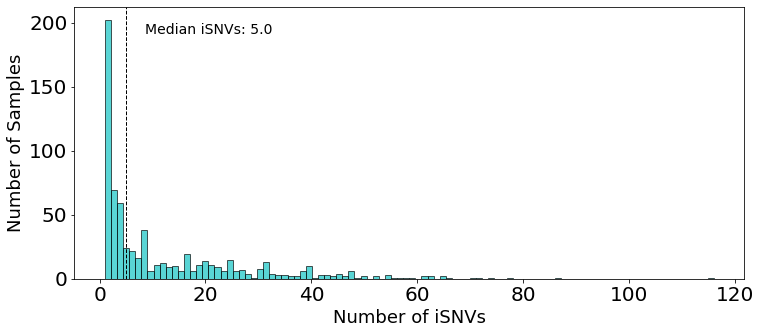

In [71]:
x = var_count_per_sample['num_vars']
result = plt.hist(x, bins=100, color='c', edgecolor='k', alpha=0.65)
plt.axvline(x.median(), color='k', linestyle='dashed', linewidth=1)

min_ylim, max_ylim = plt.ylim()
plt.text(x.median()*1.7, max_ylim*0.9, f'Median iSNVs: {x.median()}', fontsize=14)
plt.xlabel('Number of iSNVs', fontsize=18)
plt.ylabel('Number of Samples', fontsize=18)
plt.savefig('/Users/alaa/Documents/scripps/figs/iSNV_counts.svg', dpi=250, figsize=(10,15))
plt.show()

In [72]:
variants.groupby('gene').agg(min_pos=('POS', 'min'), max_pos=('POS', 'max')).sort_values('min_pos')

,min_pos,max_pos
gene,,
nan,3,29888
ORF1ab,269,21555
S,21564,25382
ORF3a,25410,26214
E,26247,26471
M,26523,27187
ORF6,27203,27382
ORF7a,27398,27754
ORF7b,27757,27887


In [73]:
var_counts = (variants.groupby(['gene', 'POS', 'ALT', 'iSNV Type'])
              .agg(ref=('REF', 'unique'), alt=('ALT', 'unique'), 
                   ref_aa=('REF_AA', 'unique'), alt_aa=('ALT_AA', 'unique'),
                   avg_freq=('ALT_FREQ', 'mean'),
                   num_samples=('sample_id', 'nunique'))
              .sort_values(['num_samples', 'avg_freq'], ascending=False)
              .reset_index())
print(var_counts.shape)
var_counts.head()

(7013, 10)


,gene,POS,ALT,iSNV Type,ref,alt,ref_aa,alt_aa,avg_freq,num_samples
0,ORF1ab,16708,G,non-synonymous,[C],[G],[L],[V],0.076991,48
1,ORF1ab,9502,T,synonymous,[C],[T],[A],[A],0.057524,41
2,ORF1ab,11083,T,non-synonymous,[G],[T],[L],[F],0.102970,25
3,ORF8,28253,T,synonymous,[C],[T],[F],[F],0.152249,12
4,nan,29737,C,unknown,[G],[C],[nan],[nan],0.082673,12


In [74]:
indel_filter = (var_counts['ALT'].str.len()!=2)
var_counts = var_counts.loc[indel_filter]
print(var_counts.shape)
var_counts.head()

(7013, 10)


,gene,POS,ALT,iSNV Type,ref,alt,ref_aa,alt_aa,avg_freq,num_samples
0,ORF1ab,16708,G,non-synonymous,[C],[G],[L],[V],0.076991,48
1,ORF1ab,9502,T,synonymous,[C],[T],[A],[A],0.057524,41
2,ORF1ab,11083,T,non-synonymous,[G],[T],[L],[F],0.102970,25
3,ORF8,28253,T,synonymous,[C],[T],[F],[F],0.152249,12
4,nan,29737,C,unknown,[G],[C],[nan],[nan],0.082673,12


In [75]:
nonsyn_filter = ~((variants['iSNV Type']=='non-synonymous') & (variants['ALT_AA'].isna()))
nonsyn_filter = ~((variants['iSNV Type'].isin(['synonymous', 'non-synonymous'])) & (variants['ALT_AA'].isna()))

isnv_types = (variants.loc[nonsyn_filter].groupby('iSNV Type')
              .agg(num_uniq_variants=('VAR', 'nunique'), num_variants=('VAR', 'count'))
              .reset_index())
isnv_types

,iSNV Type,num_uniq_variants,num_variants
0,deletion,364,499
1,insertion,6,6
2,non-synonymous,4624,5617
3,synonymous,1763,2238
4,unknown,256,357


In [76]:
isnv_types['num_uniq_variants'].sum()

7013

In [77]:
isnv_types = isnv_types.loc[isnv_types['iSNV Type']!='unknown'].sort_values('num_uniq_variants')
isnv_types['percent_variants'] = isnv_types['num_uniq_variants'] / isnv_types['num_uniq_variants'].sum()

In [78]:
# total_vars = isnv_types['num_variants'].sum()
# print(f"{total_vars} distinct iSNVs identified from 723 samples")

In [79]:
variants['VAR'].nunique()

7013

In [80]:
fig = go.Figure(data=[go.Bar(
            y=isnv_types['iSNV Type'], x=isnv_types['num_uniq_variants'], orientation='h',
            text=isnv_types['percent_variants'],
            textposition='auto',
        )])
fig.update_traces(texttemplate='%{text:.2p}', textposition='outside')
fig.update_layout(yaxis_title='iSNV Type', xaxis_title='Number of Unique iSNVs', template='plotly_white')
fig.write_image('/Users/alaa/Documents/scripps/figs/isnv_types.svg')
fig.show()

In [81]:
genes = variants.groupby('gene').agg(start_pos=('POS', 'min'), end_pos=('POS', 'max')).reset_index()
genes['gene_length'] = genes['end_pos'] - genes['start_pos']
genes.sort_values('gene_length')

,gene,start_pos,end_pos,gene_length
3,ORF10,29564,29670,106
8,ORF7b,27757,27887,130
6,ORF6,27203,27382,179
0,E,26247,26471,224
7,ORF7a,27398,27754,356
9,ORF8,27896,28257,361
1,M,26523,27187,664
5,ORF3a,25410,26214,804
2,N,28289,29528,1239
10,S,21564,25382,3818


In [82]:
# variants.loc[variants['gene']=='nan']

In [83]:
def map_gene_to_pos(x):
    pos = x['POS']
    if pos >= 269 and pos <= 21555:
        x['gene'] = 'ORF1ab'
    elif pos >= 21564 and pos <= 25382:
        x['gene'] = 'S'
    elif pos >= 25410 and pos <= 26214:
        x['gene'] = 'ORF3a'
    elif pos >= 26247 and pos <= 26471:
        x['gene'] = 'E'
    elif pos >= 26523 and pos <= 27187:
        x['gene'] = 'M'
    elif pos >= 27203 and pos <= 27382:
        x['gene'] = 'ORF6'
    elif pos >= 27398 and pos <= 27754:
        x['gene'] = 'ORF7a'
    elif pos >= 27757 and pos <= 27887:
        x['gene'] = 'ORF7b'
    elif pos >= 27896 and pos <= 28257:
        x['gene'] = 'ORF8'
    elif pos >= 28289 and pos <= 29528:
        x['gene'] = 'N'
    elif pos >= 29564 and pos <= 29670:
        x['gene'] = 'ORF10'
    return x
variants = variants.apply(map_gene_to_pos, axis=1)

In [84]:
pos_per_loc = (variants.groupby(['gene', 'POS'])
               .agg(alts=('ALT', 'unique'), alt_cnts=('ALT', pd.Series.value_counts), 
                    isnv_types=('iSNV Type', 'unique'), num_samples=('sample_id', 'nunique'))
               .reset_index()
               .sort_values('num_samples', ascending=False))
pos_per_loc['entropy'] = pos_per_loc['alt_cnts'].apply(lambda x: entropy(x))
pos_per_loc = pd.merge(pos_per_loc, genes, on='gene')
pos_per_loc['entropy_normed'] = pos_per_loc['entropy'] / pos_per_loc['gene_length']
pos_per_loc.sort_values('start_pos', inplace=True)
pos_per_loc = pos_per_loc.loc[pos_per_loc['gene']!='nan']
pos_per_loc.head()

,gene,POS,alts,alt_cnts,isnv_types,num_samples,entropy,start_pos,end_pos,gene_length,entropy_normed
2883,ORF1ab,12032,[T],1,[non-synonymous],1,0.0,269,21555,21286,0.0
2886,ORF1ab,11991,[G],1,[non-synonymous],1,0.0,269,21555,21286,0.0
2885,ORF1ab,12011,[C],1,[non-synonymous],1,0.0,269,21555,21286,0.0
2882,ORF1ab,12053,[T],1,[non-synonymous],1,0.0,269,21555,21286,0.0
2884,ORF1ab,12021,[C],1,[non-synonymous],1,0.0,269,21555,21286,0.0


In [85]:
fig = go.Figure(data=[go.Bar(
            y=pos_per_loc['gene'], x=pos_per_loc['entropy'], orientation='h',
#             hovertext=pos_per_loc[['alts', 'alt_cnts', 'isnv_types']],
#             textposition='auto',
        )])
# fig.update_traces(texttemplate='%{text:.2p}', textposition='outside')
fig.update_layout(yaxis_title='Gene', xaxis_title='Mutational Entropy')
fig.write_image('/Users/alaa/Documents/scripps/figs/gene_entropy.svg')
# fig.show()

# ORF6 Mutational Diversity
## TODO:
* for each pos
* compute reference freq REF_DP/TOTAL_DP
* add that value to the list if geq 3%
* compute entropy for that position
* compute sum entropy, divide by gene length
* display boxplot showing entropy per gene for each of the samples

In [86]:
print(variants.shape)
variants = variants.loc[~(variants['gene']=='nan')]
variants.shape

(8717, 25)


(8340, 25)

In [87]:
variants['REF_FREQ'] = variants['REF_DP'] / variants['TOTAL_DP']
variants['REF_FREQ'].max(), variants['REF_FREQ'].min(), variants['REF_FREQ'].mean()

(0.97, 0.07908246859639541, 0.9140910909560858)

In [88]:
variants = pd.merge(variants, genes, on='gene')

In [89]:
def compute_entropy(x):
    freqs = list(x['freqs'])
    if x['ref_freq'] >= 0.03:
        freqs.append(x['ref_freq'])
    return entropy(freqs)
# results

In [90]:
results = (variants.groupby(['sample_id', 'gene', 'POS', 'REF'])
                   .agg(gene_length=('gene_length', 'mean'),
                        start_pos=('start_pos', 'mean'),
                        alts=('ALT', 'unique'), num_alts=('ALT', 'nunique'), 
                        alt_cnts=('ALT', pd.Series.value_counts), 
                        ref_freq=('REF_FREQ', 'mean'),
                        freqs=('ALT_FREQ', 'unique'))
                   .sort_values('num_alts', ascending=False)
                   .reset_index())
results['entropy'] = results.apply(compute_entropy, axis=1)
results = (results.groupby(['sample_id', 'gene'])
           .agg(sum_entropy=('entropy', 'sum'),
                start_pos=('start_pos', 'mean'),
                gene_length=('gene_length', 'mean'))
           .reset_index())
results['entropy_normed'] = results['sum_entropy'] / results['gene_length']

In [91]:
results.sort_values('start_pos', ascending=True, inplace=True)

In [92]:
fig = go.Figure(go.Box(y=results['entropy_normed'], x=results['gene']))
fig.update_layout(title=f'Mutational Diversity Distribution per Gene',
                  template='plotly_white',
                  xaxis_title="Gene",
                  yaxis_title="Entropy (normalized by gene length)")
fig.write_image('/Users/alaa/Documents/scripps/figs/gene_entropy_normed.svg')
fig.show()

In [93]:
# result = (pos_per_loc.groupby('gene')
#           .agg(entropy_normed=('entropy_normed', 'sum'), start_pos=('start_pos', 'mean'))
#           .reset_index())
# result.sort_values('start_pos', ascending=False, inplace=True)

In [94]:
fig = go.Figure(data=[go.Bar(
            y=result['gene'], x=result['entropy_normed'], orientation='h',
#             template='plotly-white'
#             hovertext=pos_per_loc[['alts', 'alt_cnts', 'isnv_types']],
#             textposition='auto',
        )])
# fig.update_traces(texttemplate='%{text:.2p}', textposition='outside')
fig.update_layout(yaxis_title='Gene', xaxis_title='Mutational Entropy (normalized by gene length)',
                  template='plotly_white')
fig.data[0].marker.line.color = "blue"
fig.write_image('/Users/alaa/Documents/scripps/figs/gene_entropy_normed.svg')
fig.show()

TypeError: tuple indices must be integers or slices, not str

In [ ]:
vars_per_gene = (variants.groupby(['gene', 'iSNV Type'])
                    .agg(num_vars=('VAR', 'nunique'))
                    .reset_index())

vars_per_gene = pd.merge(vars_per_gene, genes, on='gene')
vars_per_gene['num_vars_normed'] = vars_per_gene['num_vars'] / vars_per_gene['gene_length']

filter = (vars_per_gene['gene']!='nan')
vars_per_gene = vars_per_gene.loc[filter]
vars_per_gene.sort_values('start_pos', ascending=False, inplace=True)
data = vars_per_gene.pivot(index='iSNV Type', columns='gene', values='num_vars_normed')
vars_per_gene['gene'].unique()
data = data.fillna(0)
# data

gene_order = vars_per_gene['gene'].unique().tolist()
data = data.reindex(gene_order[::-1], axis=1)

In [ ]:
# data.median()

In [ ]:
# data

In [ ]:
plt.rcParams["figure.figsize"] = (12,5)

plt.rcParams['font.size'] = 20
fig, ax = plt.subplots(1)

p = sns.heatmap(data, center=0.7)
plt.tight_layout()

plt.savefig('/Users/alaa/Documents/scripps/figs/gene_isnv_prevalence.svg', dpi=300)

plt.show()
# plt.show()

In [ ]:
del_vars = variants.loc[variants['iSNV Type']=='deletion']
del_vars['indel_len'] = del_vars['ALT'].str.len() - 1

In [ ]:
print(del_vars.shape)
(del_vars.groupby(['gene', 'POS', 'REF', 'ALT'])
 .size()
 .nlargest(10)
 .reset_index()
 .rename(columns={0: 'count'}))

In [ ]:
del_vars.loc[del_vars['indel_len']==2, ['POS', 'REF', 'ALT', 'indel_len']]

In [ ]:
x = del_vars['indel_len']
plt.rcParams["figure.figsize"] = (8,5)
result = plt.hist(x, bins=100, color='c', edgecolor='k', alpha=0.65)
plt.axvline(x.median(), color='k', linestyle='dashed', linewidth=1)

min_ylim, max_ylim = plt.ylim()
plt.text(x.median()*2.0, max_ylim*0.9, f'Median Length: {x.median()}', fontsize=20)
plt.xlabel('Length of Deletion', fontsize=20)
plt.ylabel('Number of iSNVs', fontsize=20)
plt.savefig('/Users/alaa/Documents/scripps/figs/deletion_length_hist.svg', dpi=250, figsize=(8,5))
plt.show()

In [ ]:
# fig = px.bar(isnv_types, y="iSNV Type", x="num_samples", text=f"{isnv_types['percent_samples']}",
#              title="Prevalence Distribution of Main iSNV Types")
# fig.show()

In [ ]:
fig = go.Figure(go.Box(y=variants['ALT_FREQ'], x=variants['iSNV Type']))
fig.update_layout(title=f'Frequency Distribution of Main iSNV Types',
              xaxis_title="iSNV Type",
              yaxis_title="Frequency")
fig.show()

In [54]:
# data = [
#     go.Scatter(x = , y=robs, name='Robberies'),

#     go.Scatter(x = yrs, y = emp, name='Empl Rate', 
#                 xaxis='x2') # binding to the second y axis
# ]

# # settings for the new y axis
# x2 = go.XAxis(overlaying='x', side='top')

# # adding the second y axis
# layout = go.Layout(xaxis2=x2)

# fig = go.Figure(data=data, layout=go.Layout(xaxis2=x2))

In [55]:
fig = px.scatter(var_counts, x="POS", y="num_samples", color="iSNV Type", 
                 title="iSNV Prevalence Across Samples Against Position", hover_data=['ref', 'alt', 'ref_aa', 'alt_aa'])
fig.show()

In [56]:
fig = px.scatter(var_counts, x="avg_freq", y="num_samples", color="iSNV Type", 
                 title="iSNV Prevalence Across Samples Against Frequency", hover_data=['POS', 'ref', 'alt', 'ref_aa', 'alt_aa'])
fig.show()

In [57]:
indel_counts = var_counts.loc[(var_counts['iSNV Type']=='insertion') | (var_counts['iSNV Type']=='deletion')]
fig = px.scatter(indel_counts, x="POS", y="num_samples", color="iSNV Type", 
                 title="INDEL iSNV Prevalence Across Samples Against Position", hover_data=['ref', 'alt'])
fig.show()

In [58]:
fig = px.scatter(indel_counts, x="avg_freq", y="num_samples", color="iSNV Type", 
                 title="iSNV Prevalence Across Samples Against Frequency", hover_data=['POS', 'ref', 'alt', 'ref_aa', 'alt_aa'])
fig.show()

In [59]:
locs = [x[-3:] for x in released_seqs]
np.unique(locs, return_counts=True)

(array(['01P', '987', 'CS1', 'CS2', 'IPL', 'JOR', 'NBG', 'SAN', 'TIJ'],
       dtype='<U3'),
 array([  1,   1,   8,  33, 122,  28, 123, 720,  39]))

In [60]:
variants['location'] = variants['sample_id'].apply(lambda x: x[-3:])
variants['location'].value_counts()

SAN    9583
NBG    2158
JOR     204
Name: location, dtype: int64

In [61]:
#TODO: Entropy computed on the ALT nucleotides 

In [62]:
indel_filter = (variants['ALT'].str.len()!=2)
tmp = variants.loc[indel_filter]

pos_per_loc = (tmp.groupby(['gene', 'POS'])
               .agg(alts=('ALT', 'unique'), alt_cnts=('ALT', pd.Series.value_counts), 
                    isnv_types=('iSNV Type', 'unique'), num_samples=('sample_id', 'nunique'))
               .reset_index()
               .sort_values('num_samples', ascending=False))
pos_per_loc.head()

,gene,POS,alts,alt_cnts,isnv_types,num_samples
3614,ORF1ab,16708,[G],48,[non-synonymous],48
2448,ORF1ab,9502,[T],41,[synonymous],41
2730,ORF1ab,11083,[T],25,[non-synonymous],25
6041,nan,509,"[-GTCATGTTA, -GTCATGTTATGGTT, -GTCATGTT]","[11, 4, 2]",[deletion],17
6049,nan,685,"[-AAGTCATTT, -AAGTCATTTGACTT, -AAGTCATT]","[11, 2, 1]",[deletion],14


In [63]:
pos_per_loc['entropy'] = pos_per_loc['alt_cnts'].apply(lambda x: entropy(x))

In [64]:
pos_per_loc[pos_per_loc['POS']==21979]

,gene,POS,alts,alt_cnts,isnv_types,num_samples,entropy
6446,nan,21979,"[-TTT, -TT, -TTTTTGGGTG]","[1, 1, 1]",[deletion],3,1.098612
5291,S,21979,[T],1,[synonymous],1,0.000000


# TODO:
* ignore zero entropy
* change scatter plot to bar chart for better aesthetics
* ditch the location marker

In [65]:
pos_per_loc.head()

,gene,POS,alts,alt_cnts,isnv_types,num_samples,entropy
3614,ORF1ab,16708,[G],48,[non-synonymous],48,0.000000
2448,ORF1ab,9502,[T],41,[synonymous],41,0.000000
2730,ORF1ab,11083,[T],25,[non-synonymous],25,0.000000
6041,nan,509,"[-GTCATGTTA, -GTCATGTTATGGTT, -GTCATGTT]","[11, 4, 2]",[deletion],17,0.873900
6049,nan,685,"[-AAGTCATTT, -AAGTCATTTGACTT, -AAGTCATT]","[11, 2, 1]",[deletion],14,0.655976


In [71]:
pos_per_loc

,gene,POS,alts,alt_cnts,isnv_types,num_samples,entropy,start_pos,end_pos,gene_length,entropy_normed
2183,ORF1ab,269,[T],1,[non-synonymous],1,0.000000,269,21555,21286,0.000000
2182,ORF1ab,278,[A],1,[non-synonymous],1,0.000000,269,21555,21286,0.000000
2181,ORF1ab,284,[T],1,[non-synonymous],1,0.000000,269,21555,21286,0.000000
2180,ORF1ab,285,[T],1,[non-synonymous],1,0.000000,269,21555,21286,0.000000
678,ORF1ab,295,[A],2,[synonymous],2,0.000000,269,21555,21286,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
6705,ORF10,29648,"[T, A]","[1, 1]",[non-synonymous],2,0.693147,29564,29670,106,0.006539
6727,ORF10,29656,[G],1,[synonymous],1,0.000000,29564,29670,106,0.000000
6696,ORF10,29666,"[A, T]","[2, 1]",[non-synonymous],3,0.636514,29564,29670,106,0.006005
6704,ORF10,29668,"[A, T]","[1, 1]",[synonymous],2,0.693147,29564,29670,106,0.006539


In [72]:
fig = px.scatter(pos_per_loc, x="POS", y="entropy", hover_data=['alts', 'alt_cnts', 'isnv_types'],
                 title="Mutation Entropy At Each Position Across Locations")
fig.show()

In [73]:
fig = px.scatter(pos_per_loc, x="num_samples", y="entropy", hover_data=['POS', 'alts', 'alt_cnts', 'isnv_types'],
                 title="Mutation Entropy Against Prevalence Across Locations")
fig.show()

**From the above analysis, we identify the following as positions of interest in the Sars-CoV-2 genome:**
* 6696
* 11074
* 19983
* 16708

In [74]:
meta = pd.read_csv("/home/al/code/covid/HCoV-19-Genomics/metadata.csv")
meta['ID'] = meta['ID'].apply(lambda x: ''.join(x.split('-')))

FileNotFoundError: [Errno 2] File /home/al/code/covid/HCoV-19-Genomics/metadata.csv does not exist: '/home/al/code/covid/HCoV-19-Genomics/metadata.csv'

In [ ]:
print(variants['sample_id'].unique().shape)
variants_mrgd = pd.merge(variants, meta, left_on='sample_id', right_on='ID')
print(variants_mrgd['sample_id'].unique().shape)

In [ ]:
variants_mrgd = variants_mrgd.loc[(variants_mrgd['collection_date']!='Unknown') & (variants_mrgd['collection_date']!='1900-01-00') & 
              (~variants_mrgd['collection_date'].str.contains('/'))]
variants_mrgd['collection_date'] = pd.to_datetime(variants_mrgd['collection_date'])

In [ ]:
variant_pos = 6696
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

In [ ]:
variants_time = variants_mrgd.groupby(['POS', 'collection_date']).agg(num_samples=('sample_id', 'nunique')).reset_index()

In [ ]:
variant_pos = 11074
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

In [ ]:
variant_pos = 19983
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

In [ ]:
variant_pos = 16708
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

In [ ]:
samples_time = variants_mrgd.groupby('collection_date').agg(total_samples=('sample_id', 'nunique')).reset_index()
time_mrgd = pd.merge(variants_time, samples_time, on='collection_date')
time_mrgd['num_samples_normed'] = time_mrgd['num_samples'] / time_mrgd['total_samples']
time_mrgd['day'] = time_mrgd['collection_date'].dt.day
time_mrgd_mnth = time_mrgd.groupby(['day', 'POS']).agg(num_samples_normed=('num_samples_normed', 'mean')).reset_index()
poi = [6696, 11074, 19983, 16708]
data = time_mrgd_mnth.loc[time_mrgd_mnth['POS'].isin(poi)]
data['POS'] = data['POS'].astype(str)
fig = px.scatter(data, x="day", y="num_samples_normed", color="POS", 
                 title="Mutation Prevalence Over Time", trendline='lowess')
fig.show()

## TODO:
* repeat with only non-synonymous
* repeat with insertions
* repeat with deletions

In [87]:
fig = go.Figure(go.Box(y=variants['ALT_FREQ'], x=variants['gene']))
fig.show()

In [88]:
variants['iSNV Type'].unique()

array(['non-synonymous', 'deletion', 'synonymous', 'insertion', 'unknown'],
      dtype=object)

In [89]:
nonsyn_variants = variants.loc[variants['iSNV Type']=='non-synonymous']
fig = go.Figure(go.Box(y=nonsyn_variants['ALT_FREQ'], x=nonsyn_variants['gene']))
fig.show()

In [90]:
insert_variants = variants.loc[variants['iSNV Type']=='insertion']
fig = go.Figure(go.Box(y=insert_variants['ALT_FREQ'], x=insert_variants['gene']))
fig.show()

In [91]:
delete_variants = variants.loc[variants['iSNV Type']=='deletion']
fig = go.Figure(go.Box(y=delete_variants['ALT_FREQ'], x=delete_variants['gene']))
fig.show()

In [92]:
variants.loc[variants['GFF_FEATURE'].isna(), 'sample_id'].unique().shape

(594,)

In [93]:
samples_per_gff = variants.groupby(['gene', 'iSNV Type']).agg(num_variants=('VAR', 'nunique')).reset_index()
fig = px.bar(samples_per_gff, y="gene", x="num_variants",
                 title="iSNV Prevalence Per Gene")
fig.show()

## TODO:
* replace `nan` gene based on `POS` 
* regenerate using heatmap with gene as y axis, iSNV type as x, and color as frequency

In [94]:
genes.sort_values('start_pos')

,gene,start_pos,end_pos,gene_length
11,nan,3,29888,29885
4,ORF1ab,269,21555,21286
10,S,21564,25382,3818
5,ORF3a,25410,26214,804
0,E,26247,26471,224
1,M,26523,27187,664
6,ORF6,27203,27382,179
7,ORF7a,27398,27754,356
8,ORF7b,27757,27887,130
9,ORF8,27896,28257,361


In [103]:
x = data.columns
y = data.index
z = data.values
fig = go.Figure(go.Heatmap(z = z, x = x, y = y))
fig.update_layout(coloraxis = {'colorscale':'viridis'}, height=400,
                  xaxis_title='Gene', yaxis_title='iSNV Type')
fig.update_xaxes(side="top")
fig.write_image('/Users/alaa/Documents/scripps/figs/gene_isnv_prevalence.svg')

fig.show()

In [104]:
fig = go.Figure()
isnv_types = samples_per_gene['iSNV Type'].unique()
for isnv_t in isnv_types:
    data = samples_per_gene.loc[samples_per_gene['iSNV Type']==isnv_t]
    fig.add_trace(go.Bar(x=data['num_samples'], y=data['gene'], name=isnv_t, hovertext=isnv_t, orientation='h'))
fig.update_layout(barmode='relative', title_text='iSNV Prevalence Per Gene', yaxis_title='Gene', xaxis_title='iSNV Count')
fig.show()

NameError: name 'samples_per_gene' is not defined

In [105]:
samples_per_gff = variants.groupby(['gene', 'location']).agg(num_samples=('sample_id', 'nunique')).reset_index()
fig = go.Figure()
locations = samples_per_gff['location'].unique()
for loc in locations:
    data = samples_per_gff.loc[samples_per_gff['location']==loc]
    fig.add_trace(go.Bar(y=data['num_samples'], x=data['gene'], name=loc, hovertext=loc))
fig.update_layout(barmode='relative', title_text='Mutation Prevalence Per Gene')
fig.show()

In [106]:
indel_vars = variants.loc[(variants['iSNV Type'].isin(['insertion', 'deletion'])) & (~variants['ALT'].isna())]
indel_vars['indel_len'] = indel_vars['ALT'].str.len() - 1
indel_vars[['ALT', 'indel_len']]

<ipython-input-106-f5c1c4ab10f4>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ALT,indel_len
930,-TT,2
931,-T,1
938,-GAACAATGGAACCTAGTAATAGGTTTCCTA,30
928,-TACTT,5
942,-A,1
...,...,...
83781,-G,1
83856,+T,1
83859,-TTTTTGGGTG,10
36148,-A,1


In [107]:
insert_vars = (indel_vars.loc[(indel_vars['iSNV Type']=='insertion') & (indel_vars['indel_len'] > 1)]
               .groupby('indel_len').size().reset_index().rename(columns={0: 'count'}))
fig = go.Figure(go.Bar(y=insert_vars['indel_len'], x=insert_vars['count'], orientation='h'))
fig.update_layout(barmode='relative', xaxis_title='iSNV Count', yaxis_title='Length of Insertion')
fig.show()

## TODO:
* regenerate using heatmap xaxis with gene, yaxis with indel length, and color is frequency

In [108]:
delete_vars = (indel_vars.loc[(indel_vars['iSNV Type']=='deletion') & (indel_vars['indel_len'] > 1)]
               .groupby('indel_len').size().reset_index().rename(columns={0: 'count'}))
fig = go.Figure(go.Bar(y=delete_vars['indel_len'], x=delete_vars['count'], orientation='h'))
fig.update_layout(barmode='relative', xaxis_title='iSNV Count', yaxis_title='Length of Insertion')
fig.show()

In [174]:
del_vars.groupby(['POS', 'ALT']).nunique()

,,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,REF_AA,ALT_CODON,ALT_AA,path,date,sample_id,VAR,iSNV Type,gene,location
POS,ALT,,,,,,,,,,,,,,,,,,,,,
42,-TCGATCTCTTGTAGATCTGTTCTCTA,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1
424,-GTAGAAGTTGAAAAAGGCGTT,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1
428,-AAGTTGAAAAAGGCGTTTTGCCTC,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1
504,-TCATGG,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1
507,-TGGTCATGTTATGGT,1,1,1,1,4,4,4,4,1,1,...,0,0,0,4,4,4,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29736,-GCCACGCGGAGTAC,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1
29746,-GTACGATCGAGT,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1
29751,-ATCGAGTGT,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,1,1,1


In [ ]:
del_vars = variants.loc[(variants['iSNV Type']=='deletion') & (variants['ALT'].str.len() > 3)]

In [175]:
del_vars.shape

(499, 26)

In [177]:
75 /499

0.15030060120240482

In [95]:
variants = variants.loc[~((variants['iSNV Type'].isin(['insertion', 'deletion'])) & (variants['ALT'].str.len() < 4))]
variants.groupby(['gene', 'POS', 'REF', 'ALT', 'REF_AA', 'ALT_AA', 'iSNV Type']).size().nlargest(15).reset_index().rename(columns={0: 'count'})

,gene,POS,REF,ALT,REF_AA,ALT_AA,iSNV Type,count
0,ORF1ab,16708,C,G,L,V,non-synonymous,48
1,ORF1ab,9502,C,T,A,A,synonymous,41
2,ORF1ab,11083,G,T,L,F,non-synonymous,25
3,N,29039,A,T,K,*,non-synonymous,12
4,ORF8,28253,C,T,F,F,synonymous,12
5,N,29003,C,A,Q,K,non-synonymous,10
6,ORF1ab,14625,C,T,C,C,synonymous,10
7,ORF1ab,635,C,T,R,C,non-synonymous,8
8,ORF1ab,6696,C,T,P,L,non-synonymous,8
9,S,21575,C,T,L,F,non-synonymous,8


In [200]:
(variants.groupby(['gene', 'POS', 'REF', 'ALT', 'iSNV Type'])
 .agg(num_samples=('sample_id', 'nunique'))
 .nlargest(15, 'num_samples').reset_index())

,gene,POS,REF,ALT,iSNV Type,num_samples
0,ORF1ab,16708,C,G,non-synonymous,48
1,ORF1ab,9502,C,T,synonymous,41
2,ORF1ab,11083,G,T,non-synonymous,25
3,N,29039,A,T,non-synonymous,12
4,ORF8,28253,C,T,synonymous,12
5,nan,29737,G,C,unknown,12
6,ORF1ab,509,G,-GTCATGTTATGGTT,deletion,11
7,ORF1ab,685,A,-AAGTCATTT,deletion,11
8,N,29003,C,A,non-synonymous,10
9,ORF1ab,14407,C,-CTACAAG,deletion,10


In [143]:
del_vars.loc[del_vars['gene']=='S']

,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,ALT_CODON,ALT_AA,path,date,sample_id,VAR,iSNV Type,gene,location,indel_len
928,NC_045512.2,21885,C,-TACTT,1999.0,803.0,50.0,115.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0136SAN,21885--TACTT,deletion,S,SAN,5
1404,NC_045512.2,24136,T,-ACTG,2069.0,747.0,47.0,210.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0113SAN,24136--ACTG,deletion,S,SAN,4
1073,NC_045512.2,21743,A,-ATGTTACTTGGTTCCATGCTATACATGTCTCTGGGACC,1673.0,617.0,53.0,251.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0116SAN,21743--ATGTTACTTGGTTCCATGCTATACATGTCTCTGGGACC,deletion,S,SAN,38
162,NC_045512.2,23432,A,-TTCATGCAGATCAACTTACTCCTACTTGGCGTGTTT,217721.0,114558.0,49.0,41746.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.04.30.hCoV19/variants/i...,2020-04-30,SEARCH0100SAN,23432--TTCATGCAGATCAACTTACTCCTACTTGGCGTGTTT,deletion,S,SAN,36
95625,NC_045512.2,24319,C,-CAAAAATTGATTGCCAACCAATTTAATAGTGCTATTGG,9057.0,3322.0,52.0,481.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.05.01.hCoV19/variants/i...,2020-05-01,SEARCH0171NBG,24319--CAAAAATTGATTGCCAACCAATTTAATAGTGCTATTGG,deletion,S,NBG,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84793,NC_045512.2,23554,A,-CCCATTGGTGCAGGTATATGCGCTAGTT,17011.0,529.0,45.0,719.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1572SAN,23554--CCCATTGGTGCAGGTATATGCGCTAGTT,deletion,S,SAN,28
83445,NC_045512.2,22583,G,-TTT,910.0,408.0,44.0,67.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1665SAN,22583--TTT,deletion,S,SAN,3
83447,NC_045512.2,23554,A,-CCCATTGGTGCAGGTATATGCGCTAGTT,25269.0,4071.0,42.0,1764.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1665SAN,23554--CCCATTGGTGCAGGTATATGCGCTAGTT,deletion,S,SAN,28
83991,NC_045512.2,21929,G,-CTA,632.0,450.0,44.0,40.0,0.0,20.0,...,NaN,NaN,/home/gk/analysis/2020.07.19.hCoV19/variants/i...,2020-07-19,SEARCH1556SAN,21929--CTA,deletion,S,SAN,3


In [147]:
genes

,gene,start_pos,end_pos,gene_length
0,E,26247,26471,224
1,M,26523,27187,664
2,N,28289,29528,1239
3,ORF10,29564,29670,106
4,ORF1ab,269,21555,21286
5,ORF3a,25410,26214,804
6,ORF6,27203,27382,179
7,ORF7a,27398,27754,356
8,ORF7b,27757,27887,130
9,ORF8,27896,28257,361


In [162]:
del_vars[del_vars['indel_len']>80]

,REGION,POS,REF,ALT,REF_DP,REF_RV,REF_QUAL,ALT_DP,ALT_RV,ALT_QUAL,...,ALT_CODON,ALT_AA,path,date,sample_id,VAR,iSNV Type,gene,location,indel_len


<ipython-input-194-be98efd05cc3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



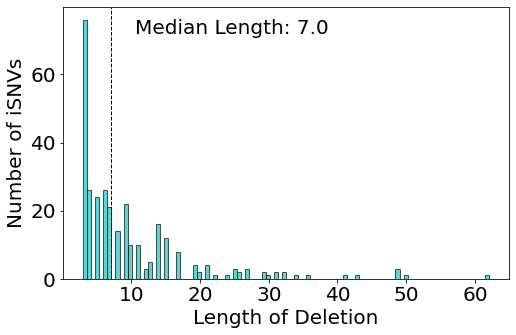

In [194]:
gene = 'ORF1ab'
del_vars['indel_len'] = del_vars['ALT'].str.len() - 1
x = del_vars.loc[del_vars['gene']==gene]['indel_len']
plt.rcParams["figure.figsize"] = (8,5)
result = plt.hist(x, bins=100, color='c', edgecolor='k', alpha=0.65)
plt.axvline(x.median(), color='k', linestyle='dashed', linewidth=1)

min_ylim, max_ylim = plt.ylim()
plt.text(x.median()*1.5, max_ylim*0.9, f'Median Length: {x.median()}', fontsize=20)
plt.xlabel('Length of Deletion', fontsize=20)
plt.ylabel('Number of iSNVs', fontsize=20)
plt.savefig(f'/Users/alaa/Documents/scripps/figs/deletion_length_hist_{gene}.svg', dpi=250, figsize=(8,5))
plt.show()

In [112]:
del_vars.columns

Index(['REGION', 'POS', 'REF', 'ALT', 'REF_DP', 'REF_RV', 'REF_QUAL', 'ALT_DP',
       'ALT_RV', 'ALT_QUAL', 'ALT_FREQ', 'TOTAL_DP', 'PVAL', 'PASS',
       'GFF_FEATURE', 'REF_CODON', 'REF_AA', 'ALT_CODON', 'ALT_AA', 'path',
       'date', 'sample_id', 'VAR', 'iSNV Type', 'gene', 'location',
       'indel_len'],
      dtype='object')

## TODO:
* compute entropy based on ALT value counts [done, to be reviewed]
* ignore any INDEL with one nucleotide insertion or deletion [done, to be reviewed]
* connect each GFF feature with corresponding gene [done, to be reviewed]
* annotate the variant count vs position with gene [TODO]
    * use `matplotlib` to do this? need to get comfortable with it
* for each gene, generate stacked bar chart annotated with synonymous or non-synonymous [done, to be reviewed]
* histogram of length of insertions and another of length of deletions [done, to be reviewed]

* explain PrimalSeq (amplicon-based) protocol first

* flowchart of the Snakemake pipeline
    * 

* iVar functionality
    * primer trimming
        * inputs
            * sorted BAM file with aligned reads
            * BED file with primers and their positions
        * parameters
            * minimum read length
            * minimum quality threshold
            * sliding window width
    * consensus generation
        * inputs
            * output from `samtools mpileup`
        * parameters
            * minimum quality score threshold
            * minimum frequency threshold
            * minimum depth 
        * outputs
            * fasta file with consensus sequences
            * text file with average quality of each base position
    * variant calling 
        * inputs
            * output from `samtools mpileup`
        * parameters
            * minimum quality score threshold
            * minimum frequency threshold
            * minimum depth 
        * outputs
            * TSV file with intra-host Single Nucleotide Variants (iSNVs)
    * describe the required paramaters for each functionality using schematic

* describe PrimalSeq protocol
    * show amplicon scheme, where primers are